# Import packages

In [1]:
# My custom functions for this project
from MyFunctions import get_links, get_constitution, get_bow, get_idf, get_PCA, TopicModel, WordEmbed

# Other packages
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from numpy.linalg import norm
from scipy.spatial.distance import pdist
import scipy.cluster.hierarchy as sch
from sklearn.decomposition import PCA
from scipy.linalg import norm, eigh
import plotly_express as px

import nltk
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize, sent_tokenize
import pandas as pd
import shifterator as sh

In [2]:
OHCO = ['country_name', 'article_num', 'para_num', 'sent_num', 'token_num']
colors = "YlGnBu"

# Prepare Corpus

In [ ]:
# Define URL of website and my custom user agent ID
url = 'https://www.constituteproject.org/constitutions?lang=en&status=in_force'
useragent = 'Mozilla/5.0 (Windows NT 10.0; Win64; x64; rv:109.0) Gecko/20100101 Firefox/111.0'

# Get constitution links
links = get_links(url)
links[0:5]

In [ ]:
# Get constitution text as a token table
TOKENS = get_constitution(links[0], useragent)
TOKENS

In [ ]:
# Get a token table for each constitution and combine them to create a corpus
all_tokens = []
for i in range(len(links)):
    TOKENS = get_constitution(links[i], useragent)
    all_tokens.append(TOKENS)
CORPUS = pd.concat(all_tokens)
CORPUS.head()

In [ ]:
# Add POS information to corpus

# Handle anomalies
CORPUS = CORPUS.dropna()

# Get POS
all_terms = CORPUS.term_str.to_list() 
pos = []
for term in range(0, len(all_terms)):
    pos_tuple = nltk.word_tokenize(all_terms[term])
 
    #  Using a POS-tagger
    pos.append(nltk.pos_tag(pos_tuple)[0][1])

# Add POS
CORPUS['pos'] = pos

In [ ]:
# Fix issue of country name not saved correctly
CORPUS.country = CORPUS.country.fillna("Cote d'Ivoire")

# Save corpus
CORPUS.to_csv('CORPUS.csv', index=False)

# Import CORPUS

In [3]:
CORPUS = pd.read_csv('CORPUS.csv')

# Analyze CORPUS

In [4]:
token_count = CORPUS.groupby('country_name').size().reset_index(name='token_count')

## General statistics

In [5]:
token_count.describe()

,token_count
count,193.000000
mean,19853.466321
std,20306.026580
min,351.000000
25%,8175.000000
50%,13868.000000
75%,26409.000000
max,184569.000000


## Country with most tokens

In [6]:
token_count.sort_values(by='token_count', ascending=False).head(1)

,country_name,token_count
183,United Kingdom,184569


## Country with least tokens

In [7]:
token_count.sort_values(by='token_count', ascending=False).tail(1)

,country_name,token_count
186,Uzbekistan,351


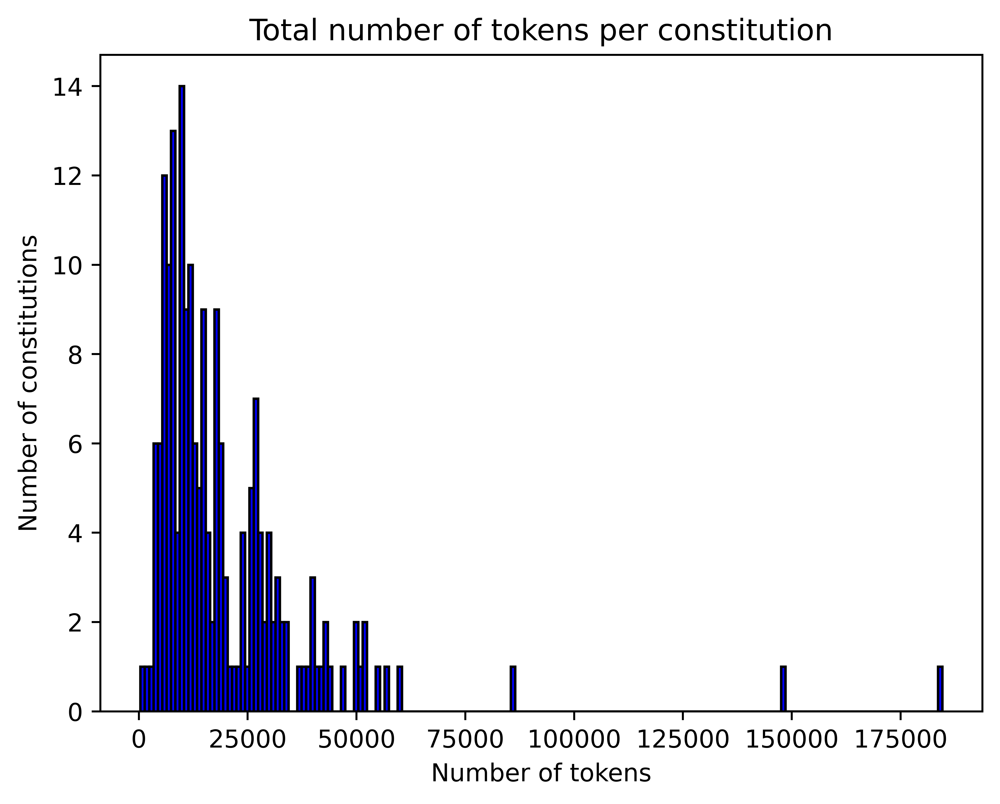

In [8]:
import matplotlib as mpl
mpl.rcParams['figure.dpi'] = 900

plt.hist(token_count['token_count'], color = 'blue', edgecolor = 'black',
         bins = int((184569-351)/1000))

plt.title('Total number of tokens per constitution')
plt.xlabel('Number of tokens')
plt.ylabel('Number of constitutions')
plt.savefig('./Figures/token_statistics.png')

# Import library

In [9]:
LIB = pd.read_csv('LIB.csv')

In [10]:
country = list(LIB.country_name.values)

In [11]:
LIB = LIB.set_index('country_name')

# Prepare vocabulary 

In [12]:
# Create Vocab
VOCAB = CORPUS.term_str.value_counts().to_frame('n').sort_index()
VOCAB.index.name = 'term_str'
VOCAB['p'] = VOCAB.n / VOCAB.n.sum()

# Annotate Vocab
# Add stopwords 
sw = pd.DataFrame(nltk.corpus.stopwords.words('english'), columns=['term_str'])
sw = sw.reset_index().set_index('term_str')
sw.columns = ['dummy']
sw.dummy = 1
VOCAB['stop'] = VOCAB.index.map(sw.dummy)
VOCAB['stop'] = VOCAB['stop'].fillna(0).astype('int')

# Compute POS ambiguity 
VOCAB['n_pos'] = CORPUS[['term_str','pos']].value_counts().unstack().count(1)

# Get Max POS
VOCAB['max_pos'] = CORPUS[['term_str','pos']].value_counts().unstack(fill_value=0).idxmax(1)

# Get Max POS Group
pos_info = f'upenn_tagset.txt'
POS = pd.DataFrame([(line.split()[0], ' '.join(line.split()[1:])) 
                    for line in open(pos_info, 'r').readlines()])
POS.columns = ['pos_id', 'pos_def']
POS = POS.set_index('pos_id')
POS['pos_group'] = POS.apply(lambda x: x.name[:2], 1)

VOCAB['max_pos_group'] =  VOCAB.max_pos.apply(lambda x: x[:2])

In [13]:
# Add TFIDF_mean (max) DFIDF with BOW
BOW = get_bow(CORPUS, bag=['country_name'])

TFIDF, DFIDF = get_idf(BOW, 'max')
TFIDF_mean = TFIDF[TFIDF > 0].mean()
VOCAB['dfidf'] = DFIDF

# Hierarchical cluster diagrams

In [14]:
# Create a reduced and collapsed version of the TFIDF table with 
# only the top 1000 common nouns, verbs, adjectives, and adverbs in descending order of DFIDF.
VOCAB_1 = VOCAB.copy()
VOCAB_1 = VOCAB_1[['max_pos', 'dfidf']].sort_values('dfidf', ascending=False)
VOCAB_1 = VOCAB_1[VOCAB_1['max_pos'].isin(['NN', 'NNS', 'VB', 'VBD', 'VBG', 'VBN', 'VBP', 'VBZ',
                                           'JJ', 'JJR', 'JJS', 'RB', 'RBR', 'RBS'])]\
                                    .head(1000)

In [15]:
# Collapse the TFIDF matrix to contain the mean TFIDF by country
TFIDF_1 = TFIDF[TFIDF.columns.intersection(list(VOCAB_1.index))].groupby('country_name').mean()

In [16]:
# Create doc-pair table
PAIRS = pd.DataFrame(index=pd.MultiIndex.from_product([country, country])).reset_index()
PAIRS = PAIRS[PAIRS.level_0 < PAIRS.level_1].set_index(['level_0','level_1'])
PAIRS.index.names = ['country_a', 'country_b']

In [17]:
# Compute cosine distance
PAIRS['cosine'] = pdist(TFIDF_1, 'cosine')

In [18]:
def hca(sims, linkage_method='ward', color_thresh=.3, figsize=(5, 50)):
    tree = sch.linkage(sims, method=linkage_method)
    labels = list(LIB.label_continent.values)
    plt.figure()
    fig, axes = plt.subplots(figsize=figsize)
    dendrogram = sch.dendrogram(tree, 
                                labels=labels, 
                                orientation="right", 
                                count_sort=True,
                                distance_sort=True,
                                above_threshold_color='.75',
                                color_threshold=color_thresh
                               )
    plt.tick_params(axis='both', which='major', labelsize=12)
    plt.savefig('./Figures/cluster.png', bbox_inches='tight')

In [19]:
hca(PAIRS.cosine, linkage_method='ward', color_thresh=1.4);

<Figure size 5760x4320 with 0 Axes>

# Principal Components (PCA)

In [20]:
# Create a reduced version of the TFIDF table with 
# only the top 1000 nouns in descending order of DFIDF
VOCAB_2 = VOCAB.copy()
VOCAB_2 = VOCAB[VOCAB.max_pos.isin(['NN', 'NNS'])].sort_values('dfidf', ascending=False).head(10000).index
TFIDF_2 = TFIDF[VOCAB_2]

In [21]:
LOADINGS, DCM, COMPINF = get_PCA(TFIDF_2, k=10, center_by_mean=False, center_by_variance=False)

In [22]:
DCM = DCM.join(LIB)

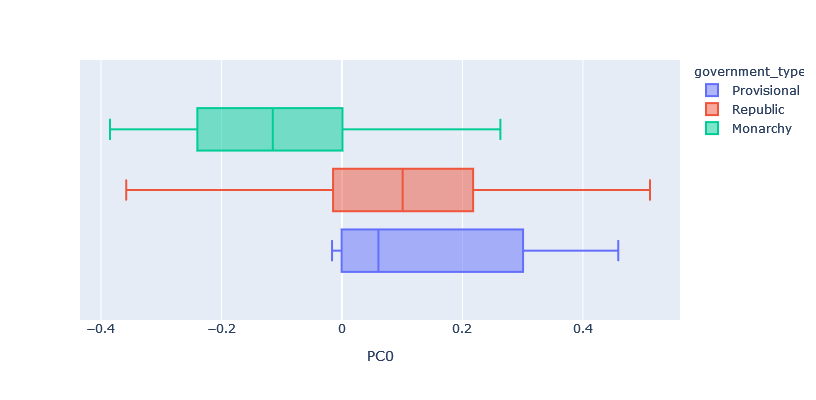

In [23]:
px.box(DCM, 'PC0', color='government_type', height=400)

In [24]:
TOPIC = 'PC0'
LOADINGS[[TOPIC]].sort_values(by=TOPIC, ascending=False)

pc_id,PC0
term_str,
republic,0.329567
congress,0.184840
collectivities,0.164857
chamber,0.160738
senate,0.124494
...,...
governor,-0.111393
king,-0.131220
house,-0.152782


# Topic Models (LDA)

In [25]:
# Create model for chapters
Model = TopicModel(CORPUS, BAG = ['country_name'])

In [26]:
# Generate LDA model
Model.create_model(n_terms = 4000, 
                   ngram_range = [1, 2], 
                   n_topics = 30, 
                   max_iter = 5, 
                   n_top_terms = 20)

In [27]:
Model.TOPICS

term_str,0,1,2,3,4,5,6,7,8,9,...,11,12,13,14,15,16,17,18,19,label
topic_id,,,,,,,,,,,,,,,,,,,,,
T00,éireann,law,president,state,constitution,article,court,office,members,government,...,section,council,provision,house,subject,exercise,chairman,powers,time,"T00 éireann, law, president, state, constituti..."
T01,republic,ukraine,state,law,azerbaijan,republic azerbaijan,president,constitution,court,right,...,rada,verkhovna,verkhovna rada,procedure,laws,lithuania,rada ukraine,president republic,citizens,"T01 republic, ukraine, state, law, azerbaijan,..."
T02,abide,portion,points,poland,police,police force,police service,policies,policy,policy state,...,polling,polling day,polling place,population,position,power person,positions,possess,possesses,"T02 abide, portion, points, poland, police, po..."
T03,law,republic,state,president,government,right,constitution,court,president republic,members,...,rights,parliament,council,office,citizens,bodies,laws,article,minister,"T03 law, republic, state, president, governmen..."
T04,person,office,section,house,court,public,constitution,law,governor,member,...,provisions,subsection,functions,time,case,commission,prime,authority,prime minister,"T04 person, office, section, house, court, pub..."
T05,person,clause,law,government,constitution,president,court,member,office,election,...,pursuant,minister,speaker,nitijela,act,cabinet,chief,council,public,"T05 person, clause, law, government, constitut..."
T06,republic,president,article,court,paragraph,law,constitution,communal,representatives,vice,...,president republic,house,vice president,public,person,decision,provisions,house representatives,president vice,"T06 republic, president, article, court, parag..."
T07,state,yang,di,yang di,law,di pertuan,pertuan,article,council,clause,...,member,person,majesty,sultan,sultan yang,majesty sultan,constitution,members,government,"T07 state, yang, di, yang di, law, di pertuan,..."
T08,law,public,tribunal,state,art,constitution,states,union,article,district,...,services,power,executive,president,counties,chamber,respective,republic,years,"T08 law, public, tribunal, state, art, constit..."


In [28]:
Model.THETA = Model.THETA.join(LIB)

In [29]:
# Get mean topic weights for each country from model C
constitution_topics = Model.THETA.groupby('label_democracy')[Model.TNAMES].mean().T

In [30]:
# Sort by topic weight for topic 10
TOPIC = 'T24'
pd.DataFrame(constitution_topics.loc[TOPIC]).sort_values(by = TOPIC, ascending = False).head(10)\
                                    .style.background_gradient(cmap='YlGnBu')

,T24
label_democracy,
Austria-Full democracy,0.977093
Sweden-Full democracy,0.968023
Switzerland-Full democracy,0.470355
Finland-Full democracy,0.317150
Liechtenstein-Not classified,0.186688
Germany-Full democracy,0.115457
Monaco-Not classified,0.079105
Japan-Full democracy,0.060936
Hungary-Flawed democracy,0.040255


# Word Embeddings (word2vec)

In [31]:
Model = WordEmbed(CORPUS, BAG=['country_name'])

In [32]:
Model.create_model(window=2, vector_size=256, min_count=50)

In [33]:
Model.get_coordinates(learning_rate=200, 
                       perplexity=20, 
                       n_components=2, 
                       init='random', 
                       n_iter=1000, 
                       random_state=42)

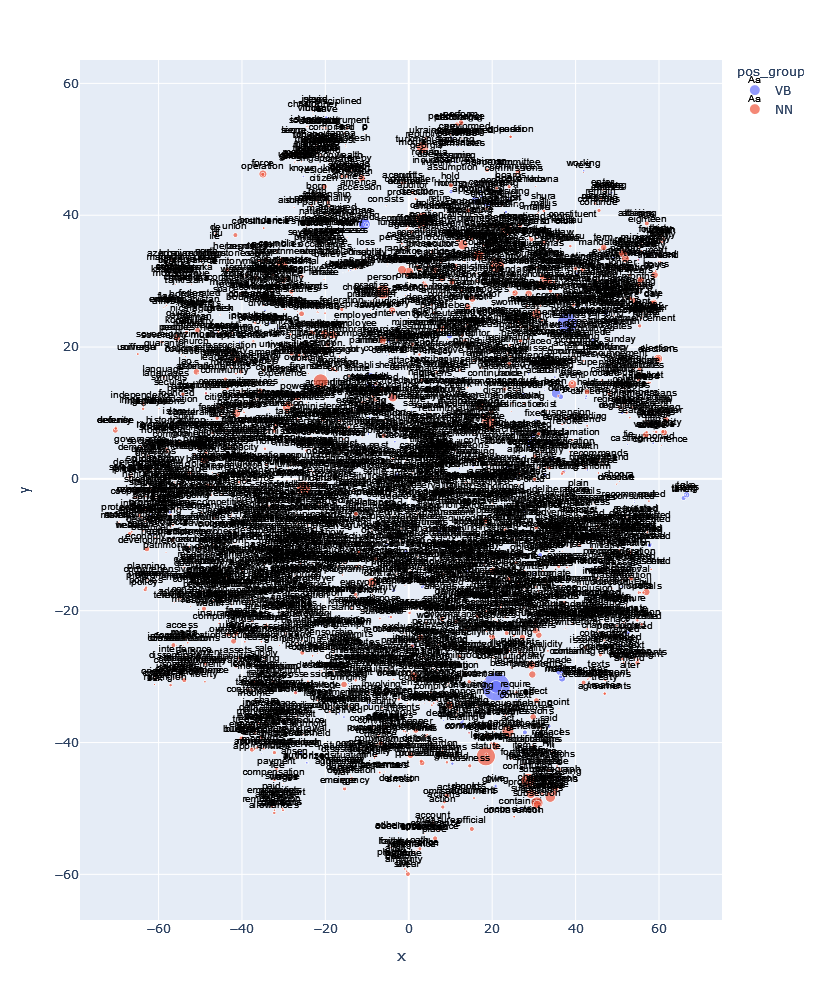

In [34]:
Model.plot()

# Sentiment Analysis

In [35]:
sh.JSDivergenceShift(BOW.loc['Korea (Democratic Peopl', 'n'].to_dict(), 
                     BOW.loc['United States of America', 'n'].to_dict()).get_shift_graph()

/home/xje4cy/.local/lib/python3.9/site-packages/shifterator/plotting.py:604: UserWarning:

FixedFormatter should only be used together with FixedLocator



<AxesSubplot:xlabel='Score shift $\\delta \\Phi_{\\tau}$ (%)', ylabel='Rank'>

In [36]:
sh.JSDivergenceShift(BOW.loc['Germany', 'n'].to_dict(), 
                     BOW.loc['Netherlands', 'n'].to_dict()).get_shift_graph()

/home/xje4cy/.local/lib/python3.9/site-packages/shifterator/plotting.py:604: UserWarning:

FixedFormatter should only be used together with FixedLocator



<AxesSubplot:xlabel='Score shift $\\delta \\Phi_{\\tau}$ (%)', ylabel='Rank'>